# US Census Geospatial data, Zillow house price data, and foursquare venue data will be analyzed across the United States to determine the best zip code to purchase a single family residence.

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Libraries imported.


# Load Zillow house value data and rental price data.

In [2]:
df = pd.read_csv('../Data/Zip_Zhvi_Summary_AllHomes.csv')
rent_df = pd.read_csv('../Data/Zip_Zri_AllHomesPlusMultifamily_Summary.csv',encoding = "ISO-8859-1")
rent_df = rent_df.rename(columns = {'MoM':'MoMZRI','QoQ':'QoQZRI','YoY':'YoYZRI'})
# Set list of price growth variable names in the data frame.
pgvars=['Zhvi','MoM','QoQ','YoY','Zri','MoMZRI','QoQZRI','YoYZRI']
df = pd.merge(df,rent_df,on='RegionName')
df

,Date_x,RegionID,RegionName,State_x,Metro_x,County_x,City_x,SizeRank_x,Zhvi,MoM,QoQ,YoY,5Year,10Year,PeakMonth,PeakQuarter,PeakZHVI,PctFallFromPeak,LastTimeAtCurrZHVI,Date_y,State_y,Metro_y,County_y,City_y,SizeRank_y,Zri,MoMZRI,QoQZRI,YoYZRI,ZriRecordCnt
0,9/30/2019,61639,10025,NY,New York-Newark-Jersey City,New York County,New York,0,973300,-0.002460,-0.000513,-0.100213,0.002568,0.025981,2016-07,2016-Q3,1136400,-0.143523,2014-11,11/30/2019,NY,New York-Newark-Jersey City,New York County,New York,0,3947.64,0.0080,0.0284,0.2005,30519
1,9/30/2019,61637,10023,NY,New York-Newark-Jersey City,New York County,New York,2,1422300,0.005088,0.013251,0.007437,0.000084,0.034253,2016-12,2016-Q4,1621900,-0.123066,2014-10,11/30/2019,NY,New York-Newark-Jersey City,New York County,New York,1,4261.47,0.0050,0.0489,0.1582,36050
2,9/30/2019,91982,77494,TX,Houston-The Woodlands-Sugar Land,Harris County,Katy,3,326700,-0.003052,-0.015667,-0.035430,0.020139,0.028028,2018-09,2018-Q3,338700,-0.035430,2018-02,11/30/2019,TX,Houston-The Woodlands-Sugar Land,Harris County,Katy,2,1769.82,0.0025,0.0083,-0.0057,42988
3,9/30/2019,84616,60614,IL,Chicago-Naperville-Elgin,Cook County,Chicago,4,419200,-0.001667,-0.015962,-0.026701,0.022480,0.020592,2019-02,2019-Q1,433800,-0.033656,2017-06,11/30/2019,IL,Chicago-Naperville-Elgin,Cook County,Chicago,3,2401.48,0.0034,-0.0175,0.0262,35577
4,9/30/2019,91940,77449,TX,Houston-The Woodlands-Sugar Land,Harris County,Katy,5,186900,0.004839,0.019084,0.048233,0.065179,0.041799,2019-09,2019-Q3,186900,0.000000,2019-09,11/30/2019,TX,Houston-The Woodlands-Sugar Land,Harris County,Katy,4,1440.43,0.0130,0.0162,-0.0061,40199
5,9/30/2019,61616,10002,NY,New York-Newark-Jersey City,New York County,New York,6,893700,-0.003012,-0.014338,-0.102350,0.013559,0.032511,2017-10,2017-Q4,1009100,-0.114359,2016-12,11/30/2019,NY,New York-Newark-Jersey City,New York County,New York,5,3797.40,0.0097,-0.0009,0.1933,12415
6,9/30/2019,91733,77084,TX,Houston-The Woodlands-Sugar Land,Harris County,Houston,7,181700,0.004978,0.021360,0.075784,0.066645,0.040552,2019-09,2019-Q3,181700,0.000000,2019-09,11/30/2019,TX,Houston-The Woodlands-Sugar Land,Harris County,Houston,6,1416.10,-0.0016,0.0128,-0.0051,30511
7,9/30/2019,93144,79936,TX,El Paso,El Paso County,El Paso,8,130700,0.002301,0.010828,0.040605,0.026999,0.010103,2007-10,2007-Q4,132400,-0.012840,2007-07,11/30/2019,TX,El Paso,El Paso County,El Paso,7,961.14,0.0133,0.0201,-0.0117,32426
8,9/30/2019,84640,60640,IL,Chicago-Naperville-Elgin,Cook County,Chicago,9,239000,0.003780,-0.002504,0.007589,0.029365,0.007179,2007-01,2007-Q1,269900,-0.114487,2004-10,11/30/2019,IL,Chicago-Naperville-Elgin,Cook County,Chicago,8,1623.35,-0.0150,-0.0087,-0.0019,21679
9,9/30/2019,61807,10467,NY,New York-Newark-Jersey City,Bronx County,New York,11,422900,-0.005409,-0.015596,0.008826,0.065876,0.037307,2019-06,2019-Q2,429600,-0.015596,2019-02,11/30/2019,NY,New York-Newark-Jersey City,Bronx County,New York,9,1791.53,0.0104,0.0460,0.0780,11442


Drop cells with missing data so machine learning algorithms will work.

In [3]:
df = df.dropna(subset=pgvars,how='any')

Isolate price-related metrics for Kmeans analysis.

In [4]:
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

prices = df.reset_index()
prices.loc[(prices[pgvars]>0.001).T.all(),:]
prices.head()

prices_group = StandardScaler().fit_transform(prices.loc[:,pgvars])
X = prices_group.copy()

See if elbow can be found when doing K-means elbow analysis on pricing data.

In [5]:
# # k means determine k
# distortions = []
# K = range(1,50)
# for k in K:
#     kmeanModel = KMeans(n_clusters=k).fit(X)
#     kmeanModel.fit(X)
#     distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / X.shape[0])

# # Plot the elbow
# plt.plot(K, distortions, 'bx-')
# plt.xlabel('k')
# plt.ylabel('Distortion')
# plt.title('The Elbow Method showing the optimal k')
# plt.show()

There appears to be an elbow around k=11, so we'll use that.

In [6]:
# set number of clusters
kclusters = 11

#price_increase
#print(price_increase
# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(X)#price_increase

# check cluster labels generated for each row in the dataframe
print(kmeans.labels_[0:11])

#df_lat_long['Cluster Labels'] = kmeans.labels_
prices['Cluster Labels'] = kmeans.labels_
prices.head()
print
# add clustering labels
#neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)
#print(neighborhoods_venues_sorted['Cluster Labels'].unique())

[4 4 1 3 0 4 7 0 5 6 8]


<function print>

Display the data with the cluster labels.

In [7]:
prices.head()

,index,Date_x,RegionID,RegionName,State_x,Metro_x,County_x,City_x,SizeRank_x,Zhvi,MoM,QoQ,YoY,5Year,10Year,PeakMonth,PeakQuarter,PeakZHVI,PctFallFromPeak,LastTimeAtCurrZHVI,Date_y,State_y,Metro_y,County_y,City_y,SizeRank_y,Zri,MoMZRI,QoQZRI,YoYZRI,ZriRecordCnt,Cluster Labels
0,0,9/30/2019,61639,10025,NY,New York-Newark-Jersey City,New York County,New York,0,973300,-0.002460,-0.000513,-0.100213,0.002568,0.025981,2016-07,2016-Q3,1136400,-0.143523,2014-11,11/30/2019,NY,New York-Newark-Jersey City,New York County,New York,0,3947.64,0.0080,0.0284,0.2005,30519,4
1,1,9/30/2019,61637,10023,NY,New York-Newark-Jersey City,New York County,New York,2,1422300,0.005088,0.013251,0.007437,0.000084,0.034253,2016-12,2016-Q4,1621900,-0.123066,2014-10,11/30/2019,NY,New York-Newark-Jersey City,New York County,New York,1,4261.47,0.0050,0.0489,0.1582,36050,4
2,2,9/30/2019,91982,77494,TX,Houston-The Woodlands-Sugar Land,Harris County,Katy,3,326700,-0.003052,-0.015667,-0.035430,0.020139,0.028028,2018-09,2018-Q3,338700,-0.035430,2018-02,11/30/2019,TX,Houston-The Woodlands-Sugar Land,Harris County,Katy,2,1769.82,0.0025,0.0083,-0.0057,42988,1
3,3,9/30/2019,84616,60614,IL,Chicago-Naperville-Elgin,Cook County,Chicago,4,419200,-0.001667,-0.015962,-0.026701,0.022480,0.020592,2019-02,2019-Q1,433800,-0.033656,2017-06,11/30/2019,IL,Chicago-Naperville-Elgin,Cook County,Chicago,3,2401.48,0.0034,-0.0175,0.0262,35577,3
4,4,9/30/2019,91940,77449,TX,Houston-The Woodlands-Sugar Land,Harris County,Katy,5,186900,0.004839,0.019084,0.048233,0.065179,0.041799,2019-09,2019-Q3,186900,0.000000,2019-09,11/30/2019,TX,Houston-The Woodlands-Sugar Land,Harris County,Katy,4,1440.43,0.0130,0.0162,-0.0061,40199,0


Getting an idea of the cluster statistics to find interesting plot.

In [8]:
price_stats_df = prices.groupby(by='Cluster Labels').describe().loc[:,(pgvars,slice(None))]
print(price_stats_df.T.head())

Cluster Labels             0              1              2              3   \
Zhvi count        2280.000000     715.000000     307.000000    1146.000000   
     mean       229404.254386  251181.398601  197337.133550  671501.832461   
     std         97265.006307  140401.898138  143514.686419  175165.600415   
     min         25700.000000   35300.000000   42100.000000  359400.000000   
     25%        160600.000000  135300.000000   99500.000000  535025.000000   

Cluster Labels            4              5              6              7   \
Zhvi count      2.120000e+02    1533.000000    1308.000000    1159.000000   
     mean       1.537700e+06  285304.109589  271665.902141  175959.361519   
     std        6.442675e+05  114388.765288  123383.037364   81519.426867   
     min        8.269000e+05   39300.000000   24900.000000   38000.000000   
     25%        1.165850e+06  195200.000000  183500.000000  123200.000000   

Cluster Labels             8             9              10  
Zhvi co

The ZHVI and ZRI are useful metrics to understand the approximate home value and rent value for the zip code. The last months, quarter's, and years price changes are also good to know for investing. The K-means grouped the data into groups of low but increasing price and high but decreasing price.

['Zhvi', 'MoM', 'QoQ', 'YoY', 'Zri', 'MoMZRI', 'QoQZRI', 'YoYZRI']


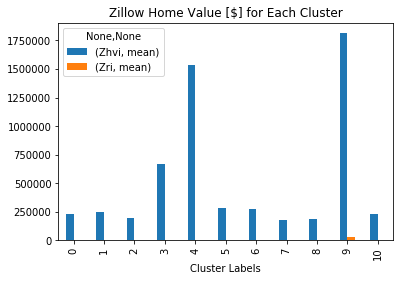

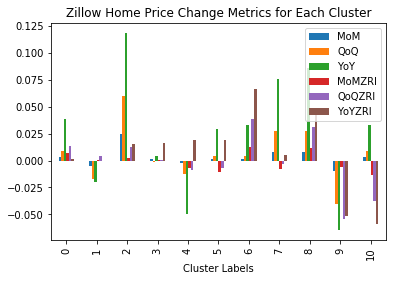

In [9]:
price_stats_df.loc[:,(['Zhvi','Zri'],'mean')].plot(kind='bar',title='Zillow Home Value [$] for Each Cluster')
price_stats_df.loc[:,(['MoM', 'QoQ', 'YoY', 'MoMZRI', 'QoQZRI', 'YoYZRI'],'mean')].droplevel(level=1,axis=1).\
plot(kind='bar',title='Zillow Home Price Change Metrics for Each Cluster')
print(pgvars)
#price_stats_df.loc[:,('Zhvi','count')].plot(kind='bar',title='# Of Zip codes in each cluster.')

# Based on the analysis of clusters above, it looks reasonable to choose only data with price increases greater than 1%. 

In [10]:
# Groups 0,2,3,6,8 are best for rent AND price increase
prices.loc[(prices[pgvars]>0.001).T.all(),:].shape


(2352, 32)

In [11]:
good_groups = [2]
good_prices = prices[prices['Cluster Labels'].isin(good_groups)]
good_prices.head()
#good_prices.shape

,index,Date_x,RegionID,RegionName,State_x,Metro_x,County_x,City_x,SizeRank_x,Zhvi,MoM,QoQ,YoY,5Year,10Year,PeakMonth,PeakQuarter,PeakZHVI,PctFallFromPeak,LastTimeAtCurrZHVI,Date_y,State_y,Metro_y,County_y,City_y,SizeRank_y,Zri,MoMZRI,QoQZRI,YoYZRI,ZriRecordCnt,Cluster Labels
63,63,9/30/2019,92617,78704,TX,Austin-Round Rock,Travis County,Austin,66,602800,0.028143,0.032369,0.153684,0.076071,0.065808,2019-09,2019-Q3,602800,0.000000,2019-09,11/30/2019,TX,Austin-Round Rock,Travis County,Austin,67,1901.02,0.0098,0.0174,0.0408,20136,2
73,73,9/30/2019,92481,78521,TX,Brownsville-Harlingen,Cameron County,Brownsville,76,74200,0.019231,0.053977,0.010899,0.032286,0.024409,2018-11,2018-Q4,74600,-0.005362,2018-11,11/30/2019,TX,Brownsville-Harlingen,Cameron County,Brownsville,77,850.73,0.0068,0.0224,0.0300,20682,2
159,159,9/30/2019,87019,65807,MO,Springfield,Greene County,Springfield,163,143800,0.030824,0.051170,0.122561,0.067158,0.030774,2019-09,2019-Q3,143800,0.000000,2019-09,11/30/2019,MO,Springfield,Greene County,Springfield,170,783.40,0.0202,0.0478,0.0346,17117,2
179,179,9/30/2019,69336,27406,NC,Greensboro-High Point,Guilford County,Greensboro,184,130400,0.020344,0.059301,0.142857,0.091164,0.032071,2019-09,2019-Q3,130400,0.000000,2019-09,11/30/2019,NC,Greensboro-High Point,Guilford County,Greensboro,192,825.37,0.0070,0.0253,0.0178,19850,2
303,303,9/30/2019,65791,19124,PA,Philadelphia-Camden-Wilmington,Philadelphia County,Philadelphia,317,108200,0.015962,0.067061,0.170996,0.099620,0.025274,2019-09,2019-Q3,108200,0.000000,2019-09,11/30/2019,PA,Philadelphia-Camden-Wilmington,Philadelphia County,Philadelphia,322,1102.99,-0.0042,0.0068,0.0101,21291,2


# Running k-means on the smaller subset shows better price increases, but there are still some localized areas with price decreases.

[7 8 2 2 0 3 0 0 6 2 2]


C:\Users\tyler\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


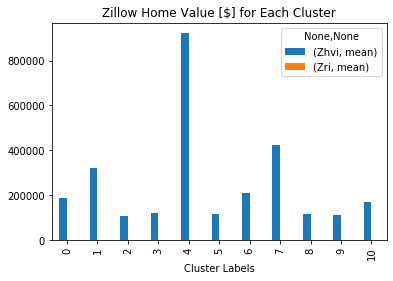

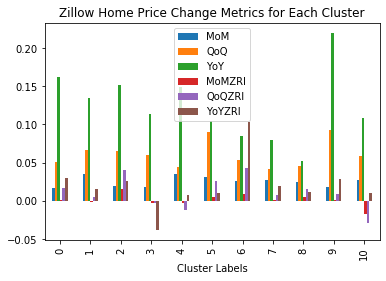

In [12]:
prices_group = StandardScaler().fit_transform(good_prices.loc[:,pgvars])
X = prices_group.copy()
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(X)#price_increase

# check cluster labels generated for each row in the dataframe
print(kmeans.labels_[0:11])

#df_lat_long['Cluster Labels'] = kmeans.labels_
good_prices['Cluster Labels'] = kmeans.labels_
good_prices.head()
price_stats_df = good_prices.groupby(by='Cluster Labels').describe().loc[:,(pgvars,slice(None))]
price_stats_df.loc[:,(['Zhvi','Zri'],'mean')].plot(kind='bar',title='Zillow Home Value [$] for Each Cluster')
price_stats_df.loc[:,(['MoM', 'QoQ', 'YoY', 'MoMZRI', 'QoQZRI', 'YoYZRI'],'mean')].droplevel(level=1,axis=1).\
plot(kind='bar',title='Zillow Home Price Change Metrics for Each Cluster')

# Load the map data so we can see where the good price increase zip codes lie on the map.

In [13]:
import pathlib
import urllib.request
import geopandas as gpd
zipcode_gdf = gpd.read_file(r"../Data/gz_2010_us_860_00_500k/gz_2010_us_860_00_500k.shp")
zipcode_gdf = zipcode_gdf.rename(columns={'ZCTA5':'Neighborhood'})
good_prices = good_prices.rename(columns={'RegionName':'Neighborhood'})
zipcode_gdf['Neighborhood']=zipcode_gdf['Neighborhood'].astype(str)
zipcode_gdf.head()
good_prices['Neighborhood'] = good_prices['Neighborhood'].astype(str)

In [14]:
prices_locs =zipcode_gdf.merge(good_prices,on='Neighborhood')

# Culling the Price Grouping vars based on 2% growth gives same result whether Kmeans is used or not, so we are going to cull, sort and plot these selected locations.

In [47]:
#fig, ax = plt.subplots(1, 1)
good_groups = [0,2,6,9]#
prices_locs=prices_locs.loc[prices_locs['Cluster Labels'].isin(good_groups),:].loc[(prices_locs[pgvars]>0.02).T.all(),:]#.plot(column='Cluster Labels',ax=ax,legend=True)

# Sort the prices and map location values based on highest month-over-month price increase. Texas contains multiple zip codes with significant price increase.

In [48]:
print('MoM \n')
prices_locs.sort_values(by='MoM',ascending=False).head()


MoM 



,Unnamed: 0,level_0,GEO_ID,Neighborhood,NAME,LSAD,CENSUSAREA,geometry,index,Date_x,RegionID,State_x,Metro_x,County_x,City_x,SizeRank_x,Zhvi,MoM,QoQ,YoY,5Year,10Year,PeakMonth,PeakQuarter,PeakZHVI,PctFallFromPeak,LastTimeAtCurrZHVI,Date_y,State_y,Metro_y,County_y,City_y,SizeRank_y,Zri,MoMZRI,QoQZRI,YoYZRI,ZriRecordCnt,Cluster Labels,Latitude,Longitude
5,5,226,8600000US76309,76309,76309,ZCTA5,5.560,"POLYGON ((-98.565961 33.917769, -98.558837 33....",6350,9/30/2019,91357,TX,Wichita Falls,Wichita County,Wichita Falls,7105,72300,0.031384,0.077496,0.147619,0.043626,0.009618,2019-09,2019-Q3,72300,0.0,2019-09,11/30/2019,TX,Wichita Falls,Wichita County,Wichita Falls,6935,805.27,0.0254,0.0507,0.0558,5269,2,33.893440,-98.536018
7,7,275,8600000US65807,65807,65807,ZCTA5,21.704,"POLYGON ((-93.36208999999999 37.13881, -93.364...",159,9/30/2019,87019,MO,Springfield,Greene County,Springfield,163,143800,0.030824,0.051170,0.122561,0.067158,0.030774,2019-09,2019-Q3,143800,0.0,2019-09,11/30/2019,MO,Springfield,Greene County,Springfield,170,783.40,0.0202,0.0478,0.0346,17117,2,37.193148,-93.284506
2,2,115,8600000US83455,83455,83455,ZCTA5,115.730,"POLYGON ((-111.399915 43.622015, -111.399848 4...",9001,9/30/2019,94179,ID,Jackson,Teton County,Victor,10746,432700,0.028279,0.055109,0.136889,0.121673,0.044226,2019-09,2019-Q3,432700,0.0,2019-09,11/30/2019,ID,Jackson,Teton County,Victor,10287,1363.49,0.0273,0.0726,0.0720,2880,6,43.605785,-111.108199
4,4,170,8600000US47978,47978,47978,ZCTA5,257.444,"POLYGON ((-87.042682 40.852479, -87.0434049999...",7339,9/30/2019,78877,IN,Chicago-Naperville-Elgin,Jasper County,Rensselaer,8411,147400,0.025748,0.050606,0.078274,0.070192,0.046571,2019-09,2019-Q3,147400,0.0,2019-09,11/30/2019,IN,Chicago-Naperville-Elgin,Jasper County,Rensselaer,8138,1112.22,0.0208,0.0577,0.0984,3960,6,40.953280,-87.147673
0,0,63,8600000US78753,78753,78753,ZCTA5,10.967,"POLYGON ((-97.67817599999999 30.407802, -97.67...",468,9/30/2019,92662,TX,Austin-Round Rock,Travis County,Austin,489,270200,0.025427,0.042438,0.122559,0.121642,0.071694,2019-09,2019-Q3,270200,0.0,2019-09,11/30/2019,TX,Austin-Round Rock,Travis County,Austin,496,1424.40,0.0206,0.0247,0.0696,10633,6,30.373265,-97.677794


# Get the coordinates of the best price increase zip codes. Get latitude and longitude for every zip code, takes a long time, dont do again.

In [17]:
import geocoder 
geolocator = Nominatim(user_agent="price_increase_analysis")

In [18]:
# lat_long = list()
# for zips in prices_locs['Neighborhood']:
#     print((str(zips)+', USA'))
#     location = geolocator.geocode((str(zips)+', USA'))
#     latitude = location.latitude
#     longitude = location.longitude
#     lat_long.append({'Latitude':latitude,'Longitude':longitude})
# lat_long_df = pd.DataFrame.from_dict(lat_long)

In [19]:
# df_lat_long = pd.concat([prices_locs.reset_index(),lat_long_df],axis=1)
# df_lat_long.head()
# df_lat_long.to_csv('../Data/Zip_Zhvi_Summary_GoodPriceHomesWithGeoCoord.csv')

In [20]:
df_lat_long = pd.read_csv('../Data/Zip_Zhvi_Summary_GoodPriceHomesWithGeoCoord.csv')
login = pd.read_csv(r'../Data/foursquare_login.txt')
print(login.columns)

Index(['id', 'secret'], dtype='object')


# Setup Foursquare Login

In [21]:
CLIENT_ID = login.id.values[0] # your Foursquare ID
CLIENT_SECRET = login.secret.values[0] # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

# print('Your credentials:')
# print('CLIENT_ID: ' + CLIENT_ID)
# print('CLIENT_SECRET:' + CLIENT_SECRET)

In [22]:
df_lat_long.head()

,Unnamed: 0,level_0,GEO_ID,Neighborhood,NAME,LSAD,CENSUSAREA,geometry,index,Date_x,RegionID,State_x,Metro_x,County_x,City_x,SizeRank_x,Zhvi,MoM,QoQ,YoY,5Year,10Year,PeakMonth,PeakQuarter,PeakZHVI,PctFallFromPeak,LastTimeAtCurrZHVI,Date_y,State_y,Metro_y,County_y,City_y,SizeRank_y,Zri,MoMZRI,QoQZRI,YoYZRI,ZriRecordCnt,Cluster Labels,Latitude,Longitude
0,0,63,8600000US78753,78753,78753,ZCTA5,10.967,"POLYGON ((-97.67817599999999 30.407802, -97.67...",468,9/30/2019,92662,TX,Austin-Round Rock,Travis County,Austin,489,270200,0.025427,0.042438,0.122559,0.121642,0.071694,2019-09,2019-Q3,270200,0.0,2019-09,11/30/2019,TX,Austin-Round Rock,Travis County,Austin,496,1424.40,0.0206,0.0247,0.0696,10633,6,30.373265,-97.677794
1,1,87,8600000US78566,78566,78566,ZCTA5,114.959,"POLYGON ((-97.40534 26.251732, -97.40539099999...",5764,9/30/2019,92510,TX,Brownsville-Harlingen,Cameron County,Los Fresnos,6385,98400,0.025000,0.041270,0.101904,0.069871,0.027664,2019-09,2019-Q3,98400,0.0,2019-09,11/30/2019,TX,Brownsville-Harlingen,Cameron County,Los Fresnos,6242,932.34,0.0288,0.0409,0.0560,5760,2,26.081632,-97.474305
2,2,115,8600000US83455,83455,83455,ZCTA5,115.730,"POLYGON ((-111.399915 43.622015, -111.399848 4...",9001,9/30/2019,94179,ID,Jackson,Teton County,Victor,10746,432700,0.028279,0.055109,0.136889,0.121673,0.044226,2019-09,2019-Q3,432700,0.0,2019-09,11/30/2019,ID,Jackson,Teton County,Victor,10287,1363.49,0.0273,0.0726,0.0720,2880,6,43.605785,-111.108199
3,3,155,8600000US46124,46124,46124,ZCTA5,61.616,"POLYGON ((-85.84626799999999 39.384041, -85.84...",8302,9/30/2019,77974,IN,Indianapolis-Carmel-Anderson,Johnson County,Edinburgh,9730,130200,0.020376,0.074257,0.197792,0.092128,0.059133,2019-09,2019-Q3,130200,0.0,2019-09,11/30/2019,IN,Indianapolis-Carmel-Anderson,Johnson County,Edinburgh,9358,1128.16,0.0205,0.0531,0.0256,2472,2,39.376667,-85.943693
4,4,170,8600000US47978,47978,47978,ZCTA5,257.444,"POLYGON ((-87.042682 40.852479, -87.0434049999...",7339,9/30/2019,78877,IN,Chicago-Naperville-Elgin,Jasper County,Rensselaer,8411,147400,0.025748,0.050606,0.078274,0.070192,0.046571,2019-09,2019-Q3,147400,0.0,2019-09,11/30/2019,IN,Chicago-Naperville-Elgin,Jasper County,Rensselaer,8138,1112.22,0.0208,0.0577,0.0984,3960,6,40.953280,-87.147673


# Create map of United States using latitude and longitude values. Plot the top prices locations. Three in Texas, one in Idaho, Springfield Missouri, and two in Indiana.

In [23]:
lat,long = df_lat_long.loc[0,['Latitude','Longitude']].values
mappy = folium.Map(location=[lat,long], zoom_start=4)
# # add markers to map
for lat, lng, borough, neighborhood in zip(df_lat_long['Latitude'], df_lat_long['Longitude'], df_lat_long['Zhvi'], df_lat_long['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(mappy)  
    
mappy

# Show Zillow Data with latitude and longitude. 

In [50]:
price_increase_data =df_lat_long
price_increase_data.head()


,Unnamed: 0,level_0,GEO_ID,Neighborhood,NAME,LSAD,CENSUSAREA,geometry,index,Date_x,RegionID,State_x,Metro_x,County_x,City_x,SizeRank_x,Zhvi,MoM,QoQ,YoY,5Year,10Year,PeakMonth,PeakQuarter,PeakZHVI,PctFallFromPeak,LastTimeAtCurrZHVI,Date_y,State_y,Metro_y,County_y,City_y,SizeRank_y,Zri,MoMZRI,QoQZRI,YoYZRI,ZriRecordCnt,Cluster Labels,Latitude,Longitude
0,0,63,8600000US78753,78753,78753,ZCTA5,10.967,"POLYGON ((-97.67817599999999 30.407802, -97.67...",468,9/30/2019,92662,TX,Austin-Round Rock,Travis County,Austin,489,270200,0.025427,0.042438,0.122559,0.121642,0.071694,2019-09,2019-Q3,270200,0.0,2019-09,11/30/2019,TX,Austin-Round Rock,Travis County,Austin,496,1424.40,0.0206,0.0247,0.0696,10633,6,30.373265,-97.677794
1,1,87,8600000US78566,78566,78566,ZCTA5,114.959,"POLYGON ((-97.40534 26.251732, -97.40539099999...",5764,9/30/2019,92510,TX,Brownsville-Harlingen,Cameron County,Los Fresnos,6385,98400,0.025000,0.041270,0.101904,0.069871,0.027664,2019-09,2019-Q3,98400,0.0,2019-09,11/30/2019,TX,Brownsville-Harlingen,Cameron County,Los Fresnos,6242,932.34,0.0288,0.0409,0.0560,5760,2,26.081632,-97.474305
2,2,115,8600000US83455,83455,83455,ZCTA5,115.730,"POLYGON ((-111.399915 43.622015, -111.399848 4...",9001,9/30/2019,94179,ID,Jackson,Teton County,Victor,10746,432700,0.028279,0.055109,0.136889,0.121673,0.044226,2019-09,2019-Q3,432700,0.0,2019-09,11/30/2019,ID,Jackson,Teton County,Victor,10287,1363.49,0.0273,0.0726,0.0720,2880,6,43.605785,-111.108199
3,3,155,8600000US46124,46124,46124,ZCTA5,61.616,"POLYGON ((-85.84626799999999 39.384041, -85.84...",8302,9/30/2019,77974,IN,Indianapolis-Carmel-Anderson,Johnson County,Edinburgh,9730,130200,0.020376,0.074257,0.197792,0.092128,0.059133,2019-09,2019-Q3,130200,0.0,2019-09,11/30/2019,IN,Indianapolis-Carmel-Anderson,Johnson County,Edinburgh,9358,1128.16,0.0205,0.0531,0.0256,2472,2,39.376667,-85.943693
4,4,170,8600000US47978,47978,47978,ZCTA5,257.444,"POLYGON ((-87.042682 40.852479, -87.0434049999...",7339,9/30/2019,78877,IN,Chicago-Naperville-Elgin,Jasper County,Rensselaer,8411,147400,0.025748,0.050606,0.078274,0.070192,0.046571,2019-09,2019-Q3,147400,0.0,2019-09,11/30/2019,IN,Chicago-Naperville-Elgin,Jasper County,Rensselaer,8138,1112.22,0.0208,0.0577,0.0984,3960,6,40.953280,-87.147673


In [25]:
neighborhood_latitude = price_increase_data.loc[2, 'Latitude'] # neighborhood latitude value
neighborhood_longitude = price_increase_data.loc[2, 'Longitude'] # neighborhood longitude value

neighborhood_name = price_increase_data.loc[2, 'City_x'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(neighborhood_name, 
                                                               neighborhood_latitude, 
                                                               neighborhood_longitude))

Latitude and longitude values of Victor are 43.605784586661905, -111.10819927161072.


# Polling the venues from Foursquare.

In [26]:
LIMIT = 100 # limit of number of venues returned by Foursquare API
radius = 500 # define radius
#\\ # create URL
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neighborhood_latitude, 
    neighborhood_longitude, 
    radius, 
    LIMIT)
url # display URL

'https://api.foursquare.com/v2/venues/explore?&client_id=5RXM2XRSCY2Z4IXZUZSI30OM3XJCGY1T4GJGYP5FJN1HNRRP&client_secret=H4FDLHCGZDESTS4T1QR4KDOSRSG5QABOL2HXELQGSKLSKYWO&v=20180605&ll=43.605784586661905,-111.10819927161072&radius=500&limit=100'

In [27]:
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '5e5c7e16c8cff2001b3cd97c'},
 'response': {'headerLocation': 'Victor',
  'headerFullLocation': 'Victor',
  'headerLocationGranularity': 'city',
  'totalResults': 15,
  'suggestedBounds': {'ne': {'lat': 43.61028459116191,
    'lng': -111.10199627669144},
   'sw': {'lat': 43.6012845821619, 'lng': -111.11440226652999}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '50679a97e4b0b9b4eaf6021d',
       'name': 'Big Hole BBQ',
       'location': {'address': '22 West Center Street',
        'lat': 43.60244812968735,
        'lng': -111.11215052498996,
        'labeledLatLngs': [{'label': 'display',
          'lat': 43.60244812968735,
          'lng': -111.11215052498996}],
        'distance': 489,
        'postalCode': '83455',
        'cc': 

In [28]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [29]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

,name,categories,lat,lng
0,Big Hole BBQ,BBQ Joint,43.602448,-111.112151
1,Victor Emporium,Ice Cream Shop,43.603560,-111.111517
2,Brakeman Grill,Burger Joint,43.603334,-111.111599
3,Victor Valley Market & Deli,Grocery Store,43.602702,-111.111630
4,Teton Springs Liquor Store,Liquor Store,43.606618,-111.110466


In [30]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

15 venues were returned by Foursquare.


In [31]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [32]:
# type your answer here
price_increase_venues = getNearbyVenues(names=price_increase_data['Neighborhood'],
                                   latitudes=price_increase_data['Latitude'],
                                   longitudes=price_increase_data['Longitude'])

78753
78566
83455
46124
47978
76309
65804
65807


In [57]:
print(price_increase_venues.shape)
print(price_increase_venues.head())
price_increase_venues = price_increase_venues.\
    merge(price_increase_data[['Neighborhood','Metro_x']],on='Neighborhood')

(53, 7)
   Neighborhood  Neighborhood Latitude  Neighborhood Longitude  \
0         78753              30.373265              -97.677794   
1         78753              30.373265              -97.677794   
2         78753              30.373265              -97.677794   
3         78753              30.373265              -97.677794   
4         78753              30.373265              -97.677794   

                   Venue  Venue Latitude  Venue Longitude       Venue Category  
0              Woodcraft       30.373300       -97.677711  Arts & Crafts Store  
1            Whataburger       30.375428       -97.676166         Burger Joint  
2                 Redbox       30.375361       -97.676700          Video Store  
3         Dollar General       30.377183       -97.678677       Discount Store  
4  Enterprise Rent-A-Car       30.377003       -97.677583  Rental Car Location  


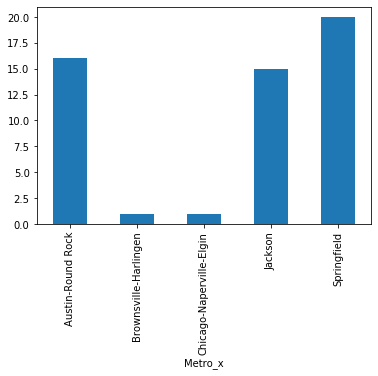

In [62]:
# Plot the number of venues for each zip code.
price_increase_venues.groupby('Metro_x').count()['Venue'].plot(kind='bar')

# Austin, TX, Springfield, MO and Jackson, ID all have plenty of venues so they will probably be good for renting. Brownsville, TX and Rensalear IN may be less developed and also higher risk for investment. 

In [63]:
price_increase_venues.loc[price_increase_venues['Neighborhood']==price_increase_venues.groupby('Neighborhood').count()['Venue'].idxmax(),:]

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Metro_x
33,65804,37.15899,-93.238492,Great American Taco,37.158725,-93.238227,Taco Place,Springfield
34,65804,37.15899,-93.238492,Metropolitan Grill,37.158780,-93.236369,American Restaurant,Springfield
35,65804,37.15899,-93.238492,Smoothie King,37.158974,-93.235966,Smoothie Shop,Springfield
36,65804,37.15899,-93.238492,AT&T,37.159009,-93.240259,Mobile Phone Shop,Springfield
37,65804,37.15899,-93.238492,Subway,37.157693,-93.239856,Sandwich Place,Springfield
38,65804,37.15899,-93.238492,The UPS Store,37.159094,-93.240328,Shipping Store,Springfield
39,65804,37.15899,-93.238492,Fuddruckers,37.159399,-93.240890,Burger Joint,Springfield
40,65804,37.15899,-93.238492,Pizza Hut,37.159085,-93.235877,Pizza Place,Springfield
41,65804,37.15899,-93.238492,Amazin Asian,37.158953,-93.236172,Asian Restaurant,Springfield
42,65804,37.15899,-93.238492,Brown Derby,37.157952,-93.240037,Liquor Store,Springfield


In [64]:
print('There are {} uniques categories.'.format(len(price_increase_venues['Venue Category'].unique())))

There are 41 uniques categories.


In [65]:
# one hot encoding
price_increase_onehot = pd.get_dummies(price_increase_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
price_increase_onehot['Neighborhood'] = price_increase_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [price_increase_onehot.columns[-1]] + list(price_increase_onehot.columns[:-1])
price_increase_onehot = price_increase_onehot[fixed_columns]

price_increase_onehot.head()

,Neighborhood,American Restaurant,Arts & Crafts Store,Asian Restaurant,BBQ Joint,Bank,Bistro,Burger Joint,Café,Coffee Shop,Convenience Store,Dessert Shop,Discount Store,Flea Market,Furniture / Home Store,Grocery Store,Gym / Fitness Center,Home Service,Hot Dog Joint,Ice Cream Shop,Intersection,Italian Restaurant,Liquor Store,Mexican Restaurant,Mobile Phone Shop,Nightclub,Park,Performing Arts Venue,Pharmacy,Pizza Place,Racetrack,Rental Car Location,Sandwich Place,Shipping Store,Shop & Service,Smoothie Shop,Spa,Sporting Goods Shop,Taco Place,Thai Restaurant,Video Store,Wine Shop
0,78753,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,78753,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,78753,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,78753,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,78753,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


In [66]:
price_increase_onehot.shape

(53, 42)

The mean of each 1-hot encoded variable w.r.t. neighborhood
represents its fraction out of the number of categories.

In [67]:
price_increase_grouped = price_increase_onehot.groupby('Neighborhood').mean().reset_index()
price_increase_grouped.head()

,Neighborhood,American Restaurant,Arts & Crafts Store,Asian Restaurant,BBQ Joint,Bank,Bistro,Burger Joint,Café,Coffee Shop,Convenience Store,Dessert Shop,Discount Store,Flea Market,Furniture / Home Store,Grocery Store,Gym / Fitness Center,Home Service,Hot Dog Joint,Ice Cream Shop,Intersection,Italian Restaurant,Liquor Store,Mexican Restaurant,Mobile Phone Shop,Nightclub,Park,Performing Arts Venue,Pharmacy,Pizza Place,Racetrack,Rental Car Location,Sandwich Place,Shipping Store,Shop & Service,Smoothie Shop,Spa,Sporting Goods Shop,Taco Place,Thai Restaurant,Video Store,Wine Shop
0,47978,0.000000,0.0000,0.000000,0.0,0.0000,0.0,0.000000,0.000000,0.0,0.0000,0.0000,0.000,0.0000,0.0000,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,1.0,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.0,0.0000,0.000000
1,65804,0.058824,0.0000,0.058824,0.0,0.0000,0.0,0.058824,0.058824,0.0,0.0000,0.0000,0.000,0.0000,0.0000,0.0,0.000000,0.0000,0.0,0.0,0.058824,0.058824,0.058824,0.0000,0.058824,0.000000,0.000000,0.0,0.058824,0.058824,0.0,0.0000,0.058824,0.058824,0.058824,0.058824,0.058824,0.0000,0.058824,0.0,0.0000,0.058824
2,65807,0.000000,0.0000,0.000000,0.0,0.0000,0.0,0.000000,0.000000,0.0,0.0000,0.0000,0.000,0.0000,0.0000,0.0,0.333333,0.0000,0.0,0.0,0.000000,0.000000,0.000000,0.0000,0.000000,0.333333,0.333333,0.0,0.000000,0.000000,0.0,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.0,0.0000,0.000000
3,78566,0.000000,0.0000,0.000000,0.0,0.0000,0.0,0.000000,0.000000,0.0,0.0000,0.0000,0.000,0.0000,0.0000,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.0,0.000000,1.000000,0.0,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.0,0.0000,0.000000
4,78753,0.000000,0.0625,0.000000,0.0,0.0625,0.0,0.062500,0.000000,0.0,0.0625,0.0625,0.125,0.0625,0.0625,0.0,0.000000,0.0625,0.0,0.0,0.062500,0.000000,0.000000,0.0625,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0625,0.062500,0.000000,0.000000,0.000000,0.000000,0.0625,0.000000,0.0,0.0625,0.000000


In [68]:
# Return the shape of the grouped dataframe.
price_increase_grouped.shape

(6, 42)

Grouping the frequency dataframe by neighborhood, then sorting by frequency to find the top 5 most popular venues for each neighborhood.

In [69]:
num_top_venues = 10
freq_rest = list()
for hood in price_increase_grouped['Neighborhood']:
    #print("----"+str(hood)+"----")
    temp = price_increase_grouped[price_increase_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp['Neighborhood']= hood
    temp = temp.round({'freq': 3})
    venue_stat = temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues).T
    freq_rest.append(venue_stat)
    print(venue_stat)
    print('\n')

                      0                    1             2                  3  \
venue         Racetrack  American Restaurant  Liquor Store  Mobile Phone Shop   
freq                  1                    0             0                  0   
Neighborhood      47978                47978         47978              47978   

                      4      5                      6         7            8  \
venue         Nightclub   Park  Performing Arts Venue  Pharmacy  Pizza Place   
freq                  0      0                      0         0            0   
Neighborhood      47978  47978                  47978     47978        47978   

                                9  
venue         Rental Car Location  
freq                            0  
Neighborhood                47978  


                                0             1           2      3  \
venue         American Restaurant  Intersection  Taco Place    Spa   
freq                        0.059         0.059       0.059  0.059  

In [70]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Make a dataframe ranking the most common venues with the name of each category 

In [72]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = price_increase_grouped['Neighborhood']

for ind in np.arange(price_increase_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(price_increase_grouped.iloc[ind, :], num_top_venues)

# It looks like Springfield, MO and Austin, TX have plenty of things to do like gyms, discount stores, nightclubs, and burger joints.

In [77]:
neighborhoods_venues_sorted=neighborhoods_venues_sorted.\
    merge(price_increase_venues[['Neighborhood','Metro_x']],on='Neighborhood').drop_duplicates()
neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Metro_x_x,Metro_x_y
0,47978,Racetrack,Wine Shop,Hot Dog Joint,Home Service,Gym / Fitness Center,Grocery Store,Furniture / Home Store,Flea Market,Discount Store,Dessert Shop,Chicago-Naperville-Elgin,Chicago-Naperville-Elgin
1,65804,Wine Shop,Pizza Place,Asian Restaurant,Burger Joint,Café,Intersection,Liquor Store,Mobile Phone Shop,Pharmacy,Italian Restaurant,Springfield,Springfield
290,65807,Gym / Fitness Center,Nightclub,Park,Wine Shop,Dessert Shop,Home Service,Grocery Store,Furniture / Home Store,Flea Market,Discount Store,Springfield,Springfield
299,78566,Pizza Place,Wine Shop,Dessert Shop,Hot Dog Joint,Home Service,Gym / Fitness Center,Grocery Store,Furniture / Home Store,Flea Market,Discount Store,Brownsville-Harlingen,Brownsville-Harlingen
300,78753,Discount Store,Burger Joint,Sandwich Place,Dessert Shop,Convenience Store,Mexican Restaurant,Home Service,Rental Car Location,Flea Market,Furniture / Home Store,Austin-Round Rock,Austin-Round Rock
